In [6]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [8, 5]

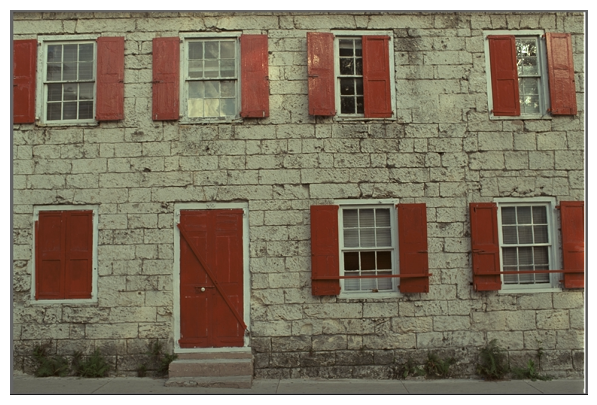

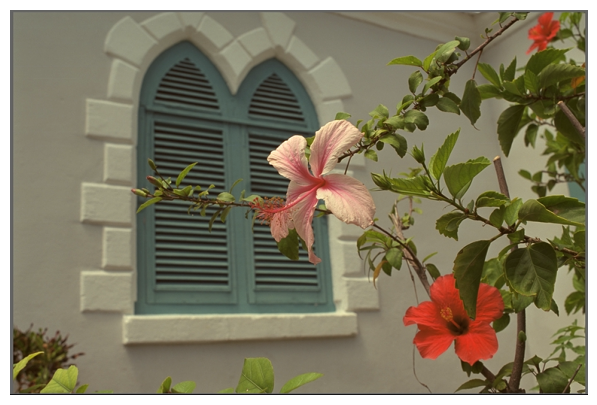

In [7]:
img = cv2.imread('kodim01.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img2 = cv2.imread('kodim07.png')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.axis("off")
plt.show()
plt.imshow(img2)
plt.axis("off")
plt.show()

(-0.5, 767.5, 511.5, -0.5)

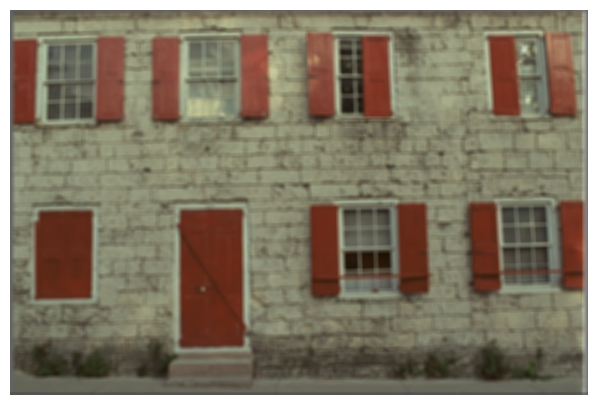

In [8]:
# Create a blurred (unsharp) version of the original image (you can use Gaussian blurring)
unsharp = cv2.GaussianBlur(img,(7,7),cv2.BORDER_DEFAULT)
plt.imshow(unsharp)
plt.axis("off")

(-0.5, 767.5, 511.5, -0.5)

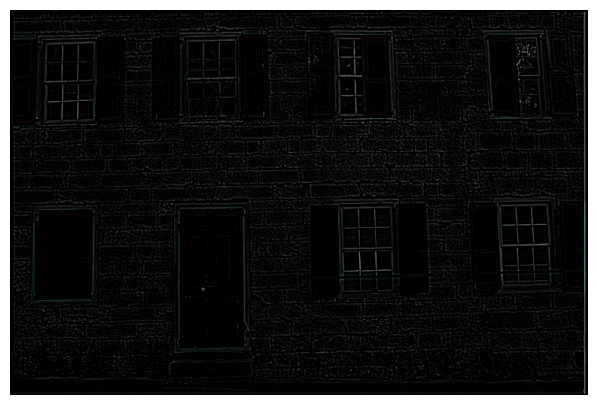

In [9]:
# Create the difference image (original − unsharp)
# Note: Remember that you are working with uint8 data types. Any addition or substractions
# might result in overflow or underflow, respectively. You can prevent this by casting the images to float.
diff = np.clip(img.astype("double") - unsharp.astype("double"), 0, 255).astype("uint8")
plt.imshow(diff)
plt.axis("off")

(-0.5, 767.5, 511.5, -0.5)

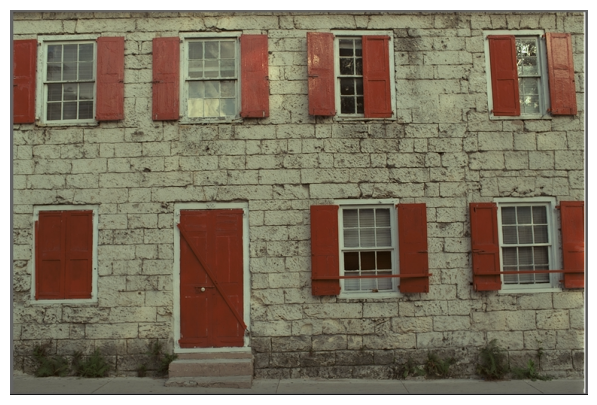

In [10]:
# Apply USM to get the resulting image using `sharpened = original + (original − unsharp) × amount`
# Note: Again, take care of underflows/overflows if necessary.
sharpened = np.clip(img.astype("double") - diff.astype("double")*0.3, 0, 255).astype("uint8")
plt.imshow(sharpened)
plt.axis("off")

(-0.5, 767.5, 511.5, -0.5)

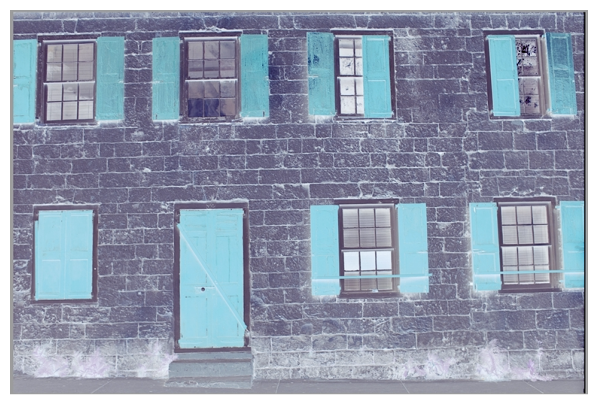

In [11]:
invert = 255 - img
plt.imshow(invert)
plt.axis("off")

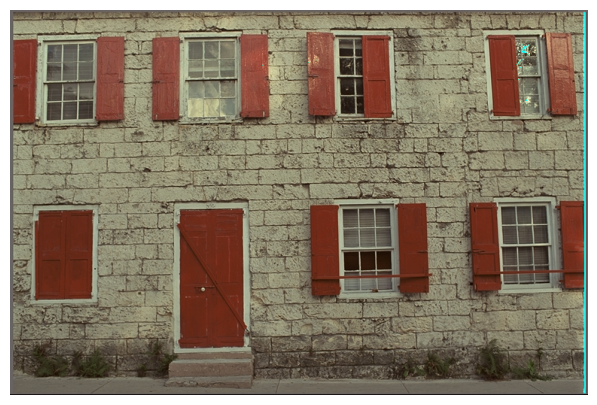

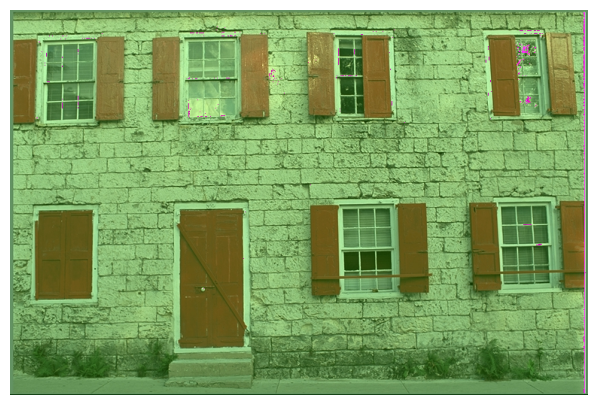

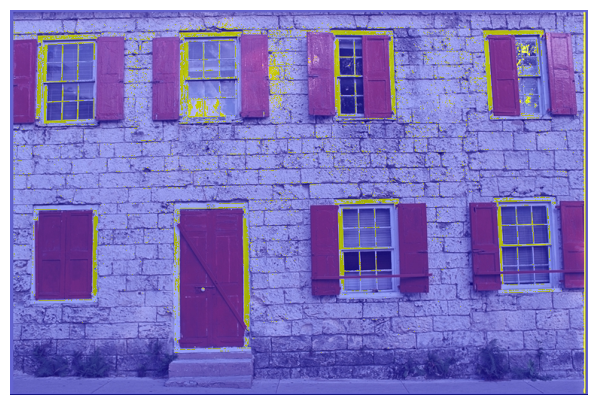

In [12]:
img_copy1 = img.copy()
img_copy1[:,:,0] = np.clip(img_copy1[:,:,0] + 5, 0, 255)
plt.imshow(img_copy1)
plt.axis("off")
plt.show()
img_copy2 = img.copy()
img_copy2[:,:,1] = np.clip(img_copy2[:,:,1] + 47, 0, 255)
plt.imshow(img_copy2)
plt.axis("off")
plt.show()
img_copy3 = img.copy()
img_copy3[:,:,2] = np.clip(img_copy3[:,:,2] + 109, 0, 255)
plt.imshow(img_copy3)
plt.axis("off")
plt.show()

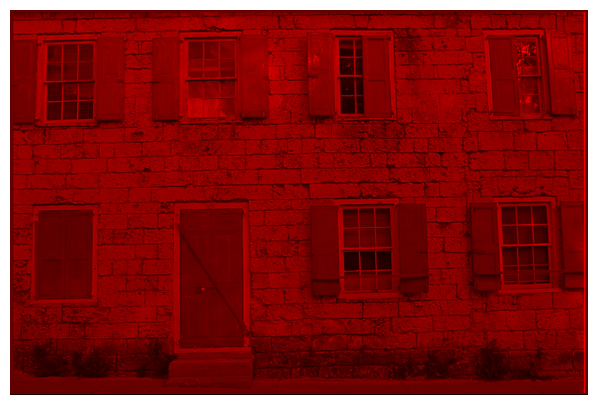

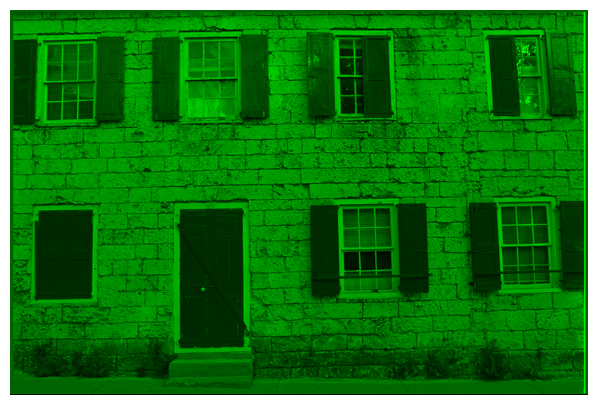

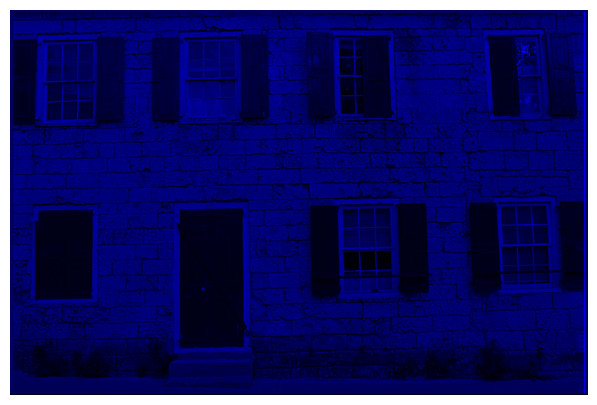

In [13]:
img_blue = np.zeros_like(img)
img_green = np.zeros_like(img)
img_red = np.zeros_like(img)

img_blue[:,:,0] = img[:,:,0]
plt.imshow(img_blue)
plt.axis("off")
plt.show()
img_green[:,:,1] = img[:,:,1]
plt.imshow(img_green)
plt.axis("off")
plt.show()
img_red[:,:,2] = img[:,:,2]
plt.imshow(img_red)
plt.axis("off")
plt.show()


(-0.5, 767.5, 511.5, -0.5)

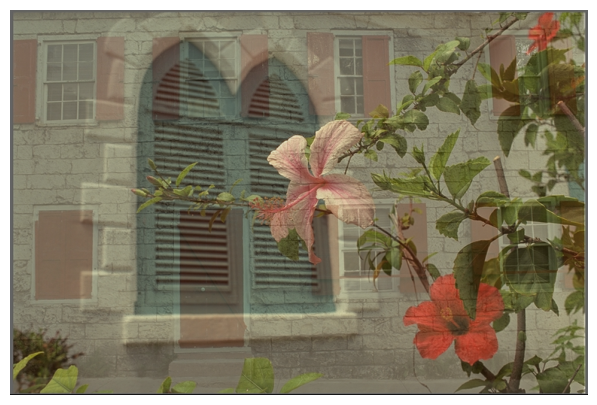

In [14]:
a = 0.3
img_new = np.clip(a*img.astype("double") + (1-a)*img2.astype("double"), 0, 255).astype("uint8")
plt.imshow(img_new)
plt.axis("off")



In [15]:
def convolution(image, kernel):
    image_height, image_width = image.shape
    kernel_height, kernel_width = kernel.shape
    
    output_height = image_height - kernel_height + 1
    output_width = image_width - kernel_width + 1
    
    output_image = np.zeros((output_height, output_width))
    
    for i in range(output_height):
        for j in range(output_width):
            output_image[i, j] = np.sum(image[i:i+kernel_height, j:j+kernel_width] * kernel)
    
    return np.clip(output_image,0,255).astype("uint8")

(-0.5, 763.5, 507.5, -0.5)

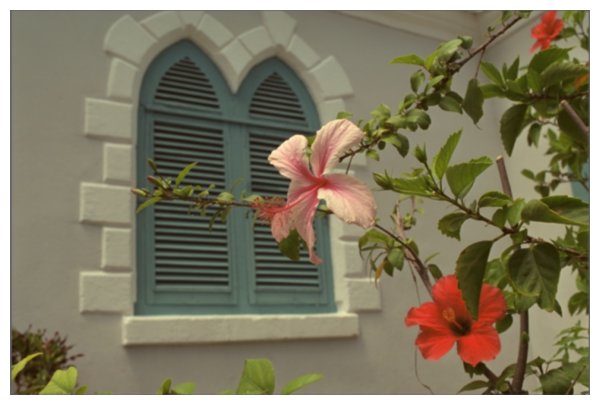

In [16]:
kernel_blur = np.array([[0.000789, 0.006581, 0.013347, 0.006581, 0.000789],
                        [0.006581, 0.054901, 0.111345, 0.054901, 0.006581],
                        [0.013347, 0.111345, 0.225821, 0.111345, 0.013347],
                        [0.006581, 0.054901, 0.111345, 0.054901, 0.006581],
                        [0.000789, 0.006581, 0.013347, 0.006581, 0.000789]])

img2_blur_r = convolution(img2[:,:,0],kernel_blur)
img2_blur_g = convolution(img2[:,:,1],kernel_blur)
img2_blur_b = convolution(img2[:,:,2],kernel_blur)
img2_blur = cv2.merge([img2_blur_r,img2_blur_g,img2_blur_b])
plt.imshow(img2_blur)
plt.axis("off")


(-0.5, 767.5, 511.5, -0.5)

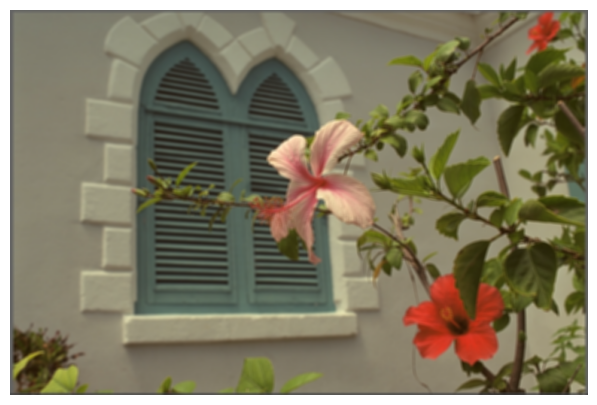

In [17]:
img2_gaussblur_r = cv2.GaussianBlur(img2[:,:,0],(5,5),cv2.BORDER_DEFAULT)
img2_gaussblur_g = cv2.GaussianBlur(img2[:,:,1],(5,5),cv2.BORDER_DEFAULT)
img2_gaussblur_b = cv2.GaussianBlur(img2[:,:,2],(5,5),cv2.BORDER_DEFAULT)
img_gaussblur = cv2.merge([img2_gaussblur_r,img2_gaussblur_g,img2_gaussblur_b])
plt.imshow(img_gaussblur)
plt.axis("off")

(-0.5, 765.5, 509.5, -0.5)

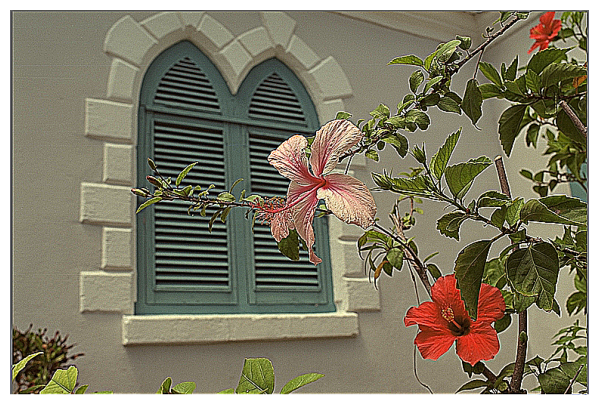

In [18]:
kernel_clarity_improvement = np.array([[-1,-1,-1],
                                       [-1, 9,-1],
                                       [-1,-1,-1]])

img2_clarity_improvement_r = convolution(img2[:,:,0],kernel_clarity_improvement)
img2_clarity_improvement_g = convolution(img2[:,:,1],kernel_clarity_improvement)
img2_clarity_improvement_b = convolution(img2[:,:,2],kernel_clarity_improvement)
img2_clarity_improvement = cv2.merge([img2_clarity_improvement_r,img2_clarity_improvement_g,img2_clarity_improvement_b])
plt.imshow(img2_clarity_improvement)
plt.axis("off")


(-0.5, 767.5, 511.5, -0.5)

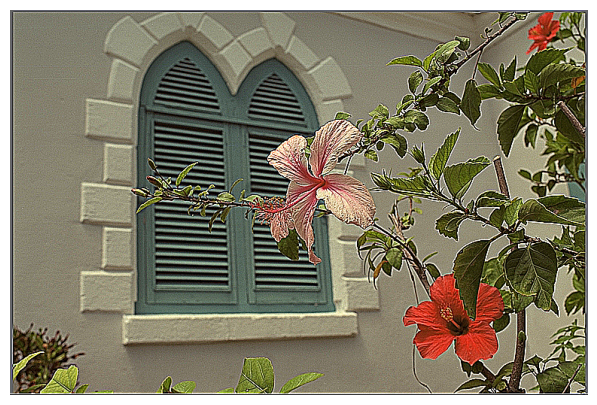

In [19]:
img_clarified = cv2.filter2D(src=img2, ddepth=-1, kernel=kernel_clarity_improvement)
plt.imshow(img_clarified)
plt.axis("off")

(-0.5, 767.5, 511.5, -0.5)

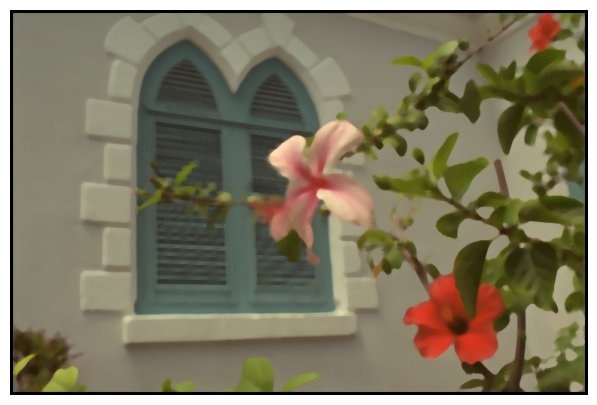

In [20]:
def median_filter(image, kernel_size):
    height, width = image.shape
    result = np.zeros((height, width), dtype=np.uint8)
    kernel_radius = kernel_size // 2

    for i in range(kernel_radius, height - kernel_radius):
        for j in range(kernel_radius, width - kernel_radius):
            neighbors = image[i - kernel_radius:i + kernel_radius + 1, j - kernel_radius:j + kernel_radius + 1]
            
            neighbors_flat = neighbors.flatten()
            neighbors_flat.sort()
            result[i, j] = neighbors_flat[len(neighbors_flat) // 2]

    return result

img2_medianfiltered_r = median_filter(img2[:,:,0],9)
img2_medianfiltered_g = median_filter(img2[:,:,1],9)
img2_medianfiltered_b = median_filter(img2[:,:,2],9)
img2_medianfiltered = cv2.merge([img2_medianfiltered_r,img2_medianfiltered_g,img2_medianfiltered_b])
plt.imshow(img2_medianfiltered)
plt.axis("off")

(-0.5, 767.5, 511.5, -0.5)

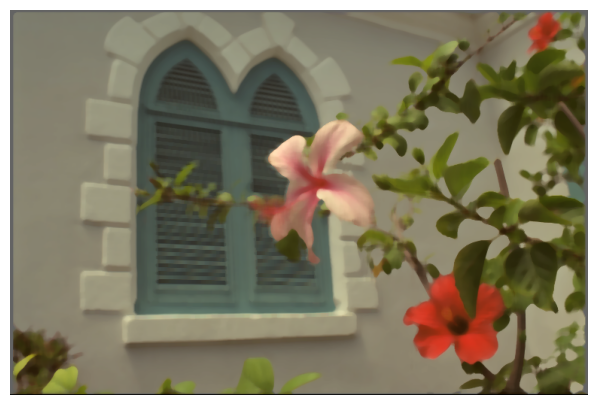

In [21]:
img2_medianblur = cv2.medianBlur(img2, 9)
plt.imshow(img2_medianblur)
plt.axis("off")

In [22]:
def erosion(image, kernel):
    result = np.zeros_like(image)
    kernel_radius = kernel.shape[0] // 2

    for i in range(kernel_radius, image.shape[0] - kernel_radius):
        for j in range(kernel_radius, image.shape[1] - kernel_radius):
            result[i, j] = np.min(image[i - kernel_radius:i + kernel_radius + 1, j - kernel_radius:j + kernel_radius + 1] * kernel)

    return result

def dilation(image, kernel):
    result = np.zeros_like(image)
    kernel_radius = kernel.shape[0] // 2

    for i in range(kernel_radius, image.shape[0] - kernel_radius):
        for j in range(kernel_radius, image.shape[1] - kernel_radius):
            result[i, j] = np.max(image[i - kernel_radius:i + kernel_radius + 1, j - kernel_radius:j + kernel_radius + 1] * kernel)

    return result

(-0.5, 767.5, 511.5, -0.5)

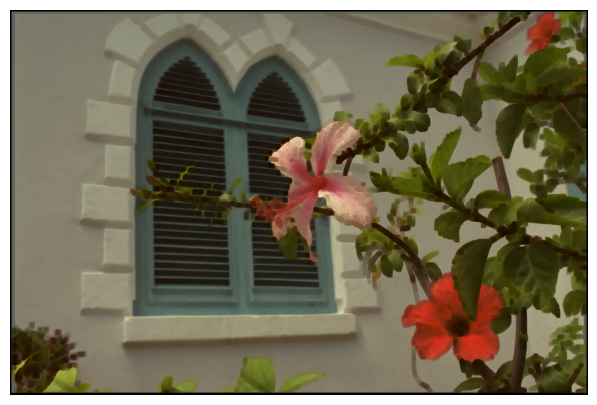

In [23]:
kernel_square = np.ones((5, 5))

img2_erosion_r = erosion(img2[:,:,0],kernel_square)
img2_erosion_g = erosion(img2[:,:,1],kernel_square)
img2_erosion_b = erosion(img2[:,:,2],kernel_square)
img2_erosion = cv2.merge([img2_erosion_r,img2_erosion_g,img2_erosion_b])
plt.imshow(img2_erosion)
plt.axis("off")

(-0.5, 767.5, 511.5, -0.5)

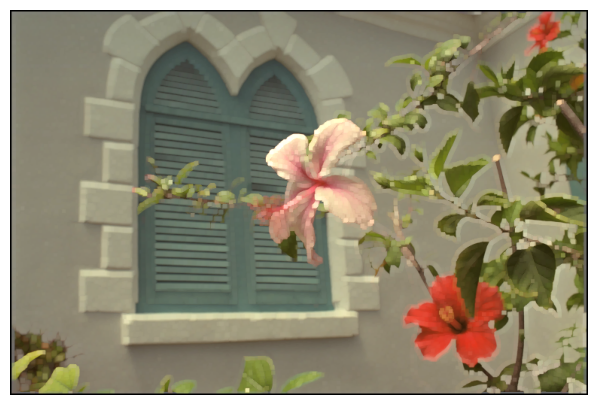

In [24]:
img2_dilation_r = dilation(img2[:,:,0],kernel_square)
img2_dilation_g = dilation(img2[:,:,1],kernel_square)
img2_dilation_b = dilation(img2[:,:,2],kernel_square)
img2_dilation = cv2.merge([img2_dilation_r,img2_dilation_g,img2_dilation_b])
plt.imshow(img2_dilation)
plt.axis("off")

(-0.5, 767.5, 511.5, -0.5)

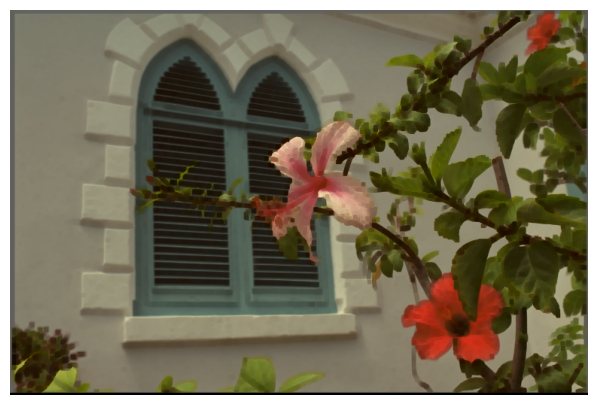

In [25]:
img2_erode = cv2.erode(img2, kernel_square) 
plt.imshow(img2_erode)
plt.axis("off")

(-0.5, 767.5, 511.5, -0.5)

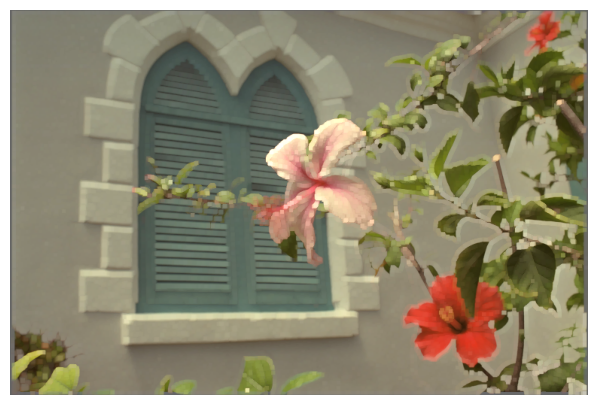

In [26]:
img2_dilate = cv2.dilate(img2, kernel_square) 
plt.imshow(img2_dilate)
plt.axis("off")

In [27]:
def convolution2(image, kernel):
    image_height, image_width = image.shape
    kernel_height, kernel_width = kernel.shape
    
    output_height = image_height - kernel_height + 1
    output_width = image_width - kernel_width + 1
    
    output_image = np.zeros((output_height, output_width))
    
    for i in range(output_height):
        for j in range(output_width):
            output_image[i, j] = np.sum(image[i:i+kernel_height, j:j+kernel_width] * kernel)
    
    return output_image

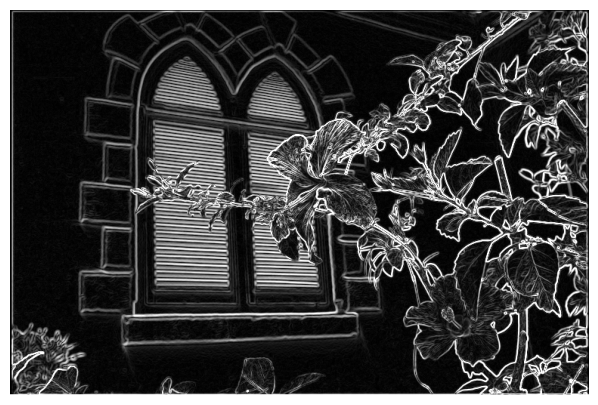

In [28]:
g_y = np.array([[-1,-2,-1],
               [0,0,0],
               [1,2,1]])

g_x = np.array([[-1,0,1],
               [-2,0,2],
               [-1,0,1]])

img2_gray = cv2.cvtColor(img2,cv2.COLOR_RGB2GRAY)/255.0

img2_gray_gx = convolution2(img2_gray, g_x)
img2_gray_gy = convolution2(img2_gray, g_y)

img2_sobel = np.clip(np.sqrt(img2_gray_gx**2+img2_gray_gy**2)*255,0,255).astype("uint8")
plt.imshow(img2_sobel,cmap="gray")
plt.axis("off")
plt.show()

(-0.5, 767.5, 511.5, -0.5)

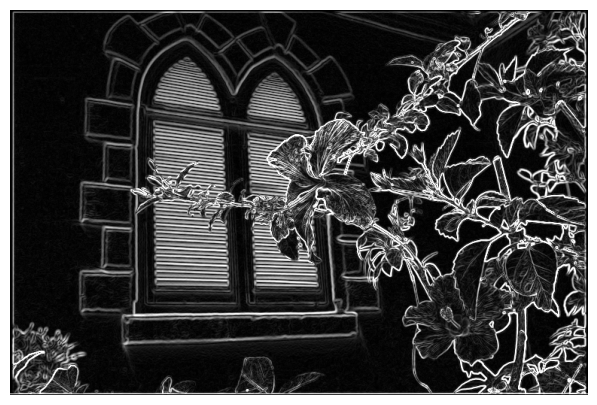

In [29]:
img2_gray_x = cv2.Sobel(img2_gray, -1,1,0)
img2_gray_y = cv2.Sobel(img2_gray, -1,0,1)

img2_Sobel = np.clip(np.sqrt(img2_gray_x**2+img2_gray_y**2)*255,0,255).astype("uint8")
plt.imshow(img2_Sobel,cmap="gray")
plt.axis("off")

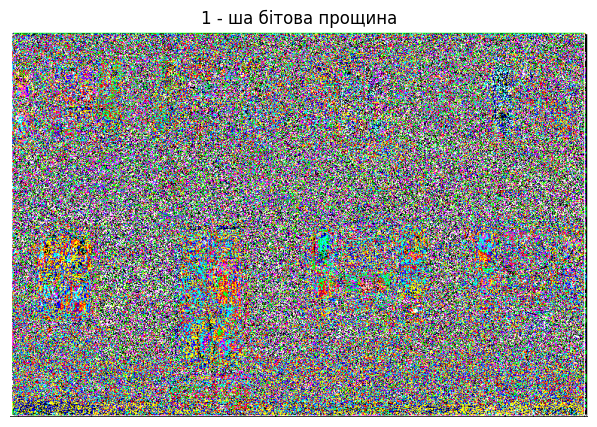

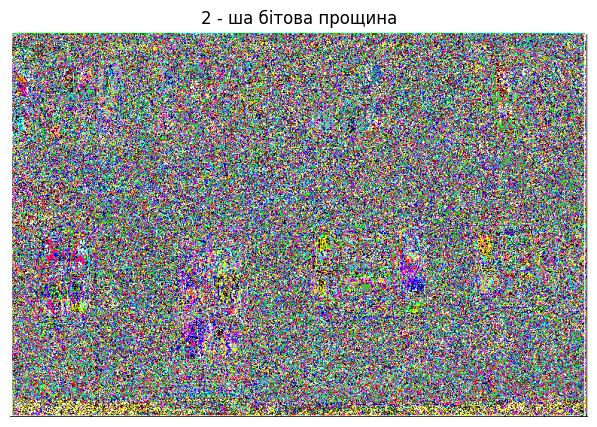

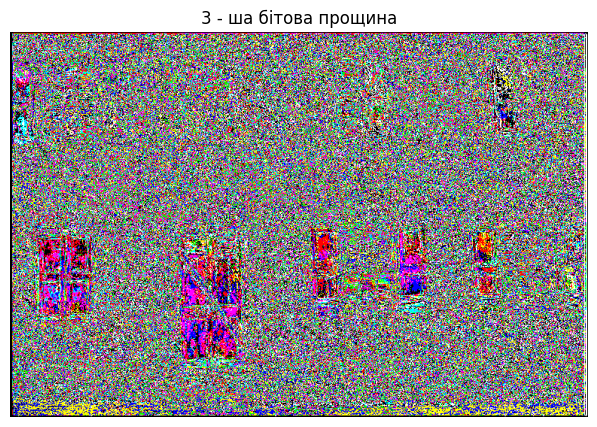

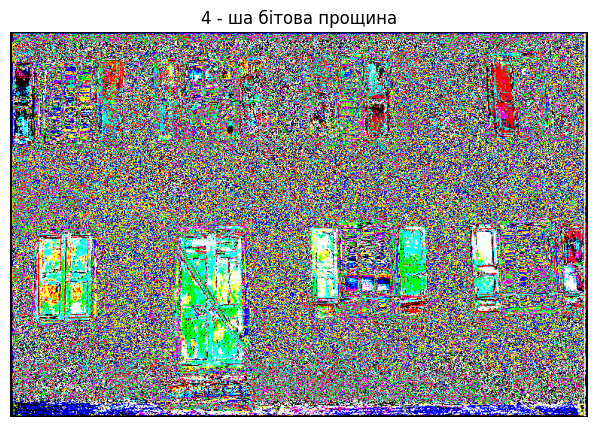

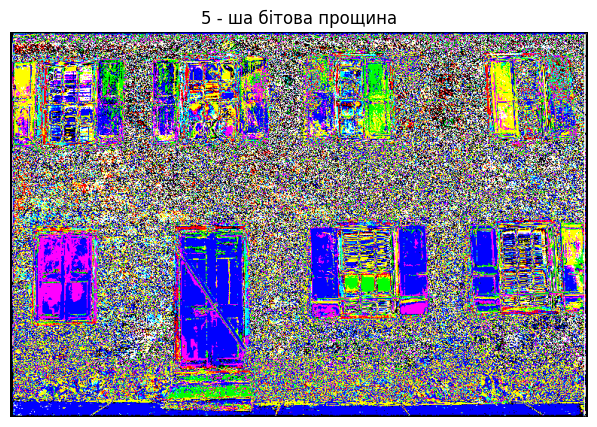

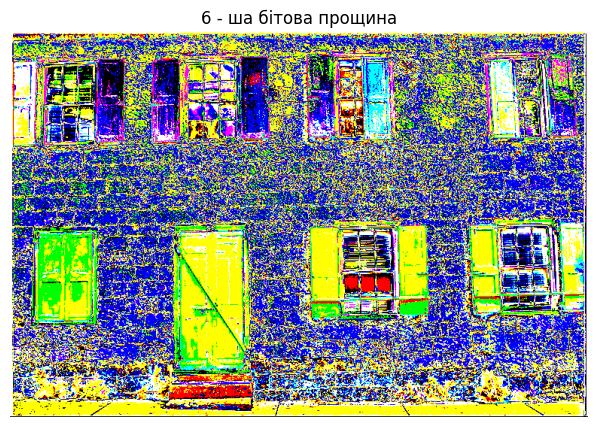

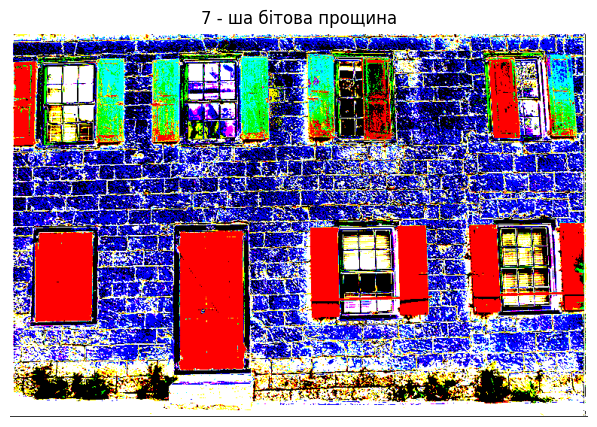

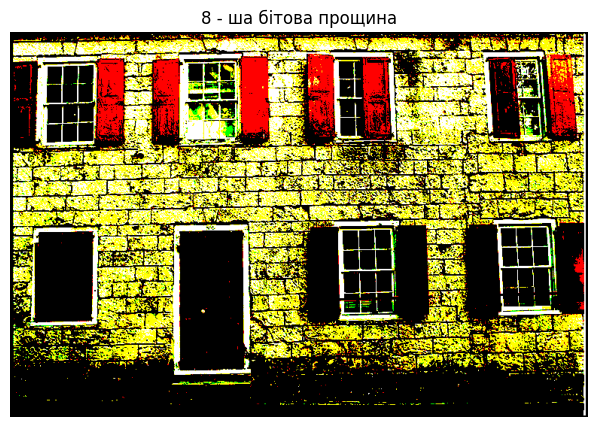

In [89]:
img2_bw = cv2.threshold(img2_gray, 0.5, 1, cv2.THRESH_BINARY)[1][150:200,150:200]

l,w,_ = img.shape
mark = np.tile(img2_bw,(l//50+1,w//50+1))
mark = mark[:l,:w]

for i in range(8):
    img2_plane_i = ((img & (1 << i)) >> i)*255

    plt.title(f"{i+1} - ша бітова прощина")
    plt.imshow(img2_plane_i,cmap="gray")
    plt.axis("off")
    plt.show()

In [90]:
for i in range(8):
    img2_plane_i = ((img & (1 << i)) >> i)*255

    plt.title(f"{i+1} - ша бітова прощина")
    plt.imshow(img2_plane_i,cmap="gray")
    plt.axis("off")
    plt.show()

    a1 = a&(~(1 << i)) # занулення ітого біта в а
    b1 = b&(1 << i) # зануллення всіх крім ітого біта в б
    a1|b1 # присвоєння значення ітого біта б в ітий біт а

    a   b   b    
    0 * 0 = 0
    0 * 1 = 1
    1 * 0 = 0
    1 * 1 = 1

SyntaxError: cannot assign to expression here. Maybe you meant '==' instead of '='? (3132548618.py, line 9)